# Healthcare Sector Employee Attrition Exploratory Data Analysis

## Introduction

In this notebook we are going to apply an Exploratory Data Analysis (EDA) to the Watson Health Care employees dataset. 
The dataset contains employee and company data useful for supervised ML, unsupervised ML, and analytics.

The main scope of the EDA is to analyse and find insights about the employees and the patterns or factors driving them quitting the job.

Dataset Source: [LINK](https://www.kaggle.com/code/ilarrumbide/classification-models-logistic/data)

## About the dataset
The dataset contains sociodemographic infor  and a target  categorical variable named 'Attrition' that means if an employee left the job (Yes/No)

**Dataset Dictionary**

- **Age**: age of the employee
- **Attrition**: target variable, or the indication if the employee quit the job or not
- **BusinessTravel**: States the frequency of business travel of each employee
- **Department**: Healthcare department of the employee
- **DistanceFromHome**: How far the employee lives from the healthcare premises
- **DailyRate**: the daily wage of the employee
- **Education**: Level of education of the employee
- **EducationField**: Type of studies of the employee
- **EmployeeCount**: Count of the employee
- **EnvironmentSatisfaction**: Numeric level of the employee satisfaction
- **Gender**: Gender of the employee
- **HourlyRate**: Wage per hour
- **JobInvolvement**: Numeric measure of job engagement
- **JobLevel**: Numeric measure of the employee grade
- **JobRole**: Type of role of the employee
-**JobSatisfaction**: Numeric measure of the employee satisfaction
- **MaritalStatus**: Employee status (eg. single, married, divorced)
- **MonthlyRate**: monthly wage rate of the employee
- **MonthlyIncome**: monthly wage of the employee
- **NumCompaniesWorked**: How many companies the employee worked
-**Over18**: Employee older than 18 yrs old
-**OverTime**: Employee working overtime
-**PercentSalaryHike**: % of pay rise
- **PerformanceRating**: rating of the employee performance
- **RelationshipSatisfaction**: Numeric measure of the employee statisfaction
- **StandardHours**: employee worked standard hours
- **Shift**: Numeric measure of the work shift of the employee
- **TotalWorkingYears**: amount of years worked from the employee
- **TrainingTimesLastYear**: Numeric measure of the amount of training the employee attended the previous year
- **WorkLifeBalance**: Numeric measure of the work life balance of the employee
- **YearsAtCompany**: Numbers of years the employee worked at the company
- **YearsInCurrentRole**: how many years the employee worked in the current role
- **YearsSinceLastPromotion**: how many years passed since the last promo of the employee
- **YearsWithCurrentManager**: how many years the employee spent with the current manager

## EDA Action Plan

Looking at the features above, the EDA we are going to implement aims to find key insights on the reasons why the employees quit their job.

In the course of the EDA below and looking at the features, we will formulate assumptions and observations.

The EDA steps we are going to follow are:

- **Import Python Libraries**
- **Data Structure and Cleaning**
- **Numerical features distribution and relationship**
- **Categorical features overview and relationship**
- **Categorical and numerical relationship**
- **Conclusion/takeaway or multiple takeaways**



## Import Python Libraries for data analysis and visualization

The main libraries we are going to import are:

- Pandas: to work with the tabular data
- Numpy: to work with matricial data if needed
- Matplotlib and Seaborn: we are going to use mainly the Noteable DEX tool to visualize and analyse the data, however, we will import matplotlib and seaborn as a backup

In [ ]:
# import the libraries

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns

## Data Structure and Cleaning

For this step we are going to create the dataframe from the CSV file of the [watson healthcare dataset](https://app.noteable.io/f/6bb65325-c6d1-483c-b514-ce97f266cb94). After creating the dataset we are going to:

- Look at the datatypes, how many features we have
- Missing values and what to do with them
- Cleaning/deleting unnecessary columns
- Renaming redundant categorical values

In [ ]:
# Create the dataframe

df = pd.read_csv('watson_healthcare_modified.csv')

df

In [ ]:
# check how many features counting the columns

len(df.columns)

35

**Datatypes, number of features and missing values:**

Datatypes are all recognized correctly and the dataset contains 35 features.
Luckily we have no missing values :-)

**Cleaning/deleting unnecessary columns**

We are going to drop/delete some of the columns. See below and the rationale:

- **EmployeeID**: it is just the unique identification code and not provides any meaningful information to the dataset
- **DailyRate, HourlyRate, MonthlyRate**: we are going to keep only the MonthlyIncome as a reference to the employee salary to don't create confusion within the data
- **Over18, StandardHours, EmployeeCount**:we delete those features because there is only one value (Yes, 80, 1 respectively)

In [ ]:
# cleaning deleting the unnecessary columns with pandas.drop

df.drop(['EmployeeID', 'DailyRate', 'HourlyRate', 'MonthlyRate', 'Over18', 'StandardHours', 'EmployeeCount'], axis=1, inplace=True)
df.head()

**Renaming redundant categorical values**

The feature Job Role contains redundant values Admin and Administrative that means the same thing. Therefore we are going to rename Administrative into Admin.

In [ ]:
# Replace the category Administrative with Admin

df.replace({'JobRole': 'Administrative'}, 'Admin', inplace=True)
df

## Numerical features distribution and relationship

To analyze the numerical features of the dataset we are going to create a separated pandas dataframe with only numerical features.

After that we are going to apply:

- **Numerical Feautures Distribution**

This step consists to understand numeric data distribution, mean, median, outliers. 

Usually at this stage the questions to answer are:

- Are the max/min values reasonable for the variables? Do you see any values that look like errors?
- What is the mean for each variable? What do the means tell you about your dataset as a whole?

- **Numerical Features Relationship**

This step consists to find understand if the are significant relationship within the numerical features that might explain any data pattern that could provide any meaningful insight.

We are going to apply a standard correlation matrix and if we find any high correlation between the features we draw a regression chart to understand even more if the relationship is strong enough to provide useful insights.



**Creation of the only numeric dataframe with pandas**

In [ ]:
# Get the Numerical Data list to infer distribution plots

numerical = [var for var in df.columns if df[var].dtype!='O']

print('There are {} numerical variables\n'.format(len(numerical)))

print('The numerical variables are :', numerical)

There are 20 numerical variables

The numerical variables are : ['Age', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'Shift', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


In [ ]:
# Create the dataset 

df_num = df[['Age', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'Shift', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']]

df_num

**Numerical Feautures Distribution Observation**

- No abnormal data/no outliers
- The age average is around 36 years

**The numerical features that will be analyzed later with attrition to see if there is a pattern on quitting the job are:
- Distance from work 
- Monthly Income 
- PercentSalaryHike
- Performance Rating
- RelationshipSatisfaction 
- Shift
- YearsInCurrentRole 
- YearsSinceLastPromotion
- YearsWithCurrManager
- JobSatisfaction
- JobInvolment
- Age

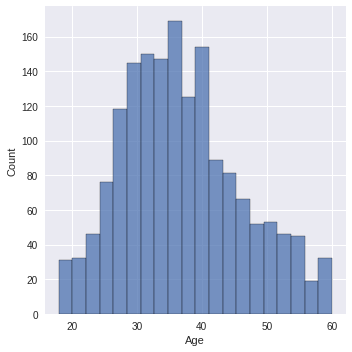

In [ ]:

sns.displot(data=df_num, x=df_num['Age'])
plt.show()

**Numerical Features Relationship**

We are going to use DEX Heatmap

In [ ]:
df_num

From the correlation matrix we can see that there are some strong correlations. We take in consideration only the correlations higher than 60% and we draw a scatterplot.

The relationships we are going to explore with a scatterplot are:

- Age TotalWorkingYears
- JobLevel TotalWorkingYears
- JobLevel MonthlyIncome
- PercentSalaryHike PerformanceRating
- TotalWorkingYears MonthlyIncome


In [ ]:
# Scatterplot with stronger correlations (>60)

df_num

## Categorical features Analysis

After observing the relationship and distribution of numerical features, we are going to investigate the categorical features of the dataset to check if there are meaningful relationships between them to formulate the assumptions of the potential cause of attrition.

**Basic assumptions:**

As a reminder, the attrition is not high, only ~200 employees left the health care service.

We are not going to analyse each categorical values but only the ones we assume could potentially affect the attrition.

**Which category or characterstic would affect attrition?**

To investigate if there are relationships or causes affecting the attrition, we are going to create contingency tables for the categories and visualize them, then we are going to implement a chi square test to check if the relationship is statistical significant. 

The features are:

- 'BusinessTravel'
- 'Department',
- 'JobRole',
- 'OverTime'
- 'Gender'
- 'Marital Status'

**Categorical features only dataframe**

We create a categorical features only dataframe to facilitate our reference for the data analysis.

After that we create a contingency table with Pandas Crosstab function to analyse the relationship between categorical features.

In [ ]:
# First we'll get the categorical only features

categorical = [var for var in df.columns if df[var].dtype == 'O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 8 categorical variables

The categorical variables are : ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [ ]:
df_cat = df[['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime', 'Attrition']]
df_cat

**Visualization of categorical data**

We are going to create some bar charts summary overview of the categorical data to try to figure out if there is any particular factor to observe when we will analyse the relationship within the categories.

<AxesSubplot:xlabel='EducationField', ylabel='count'>

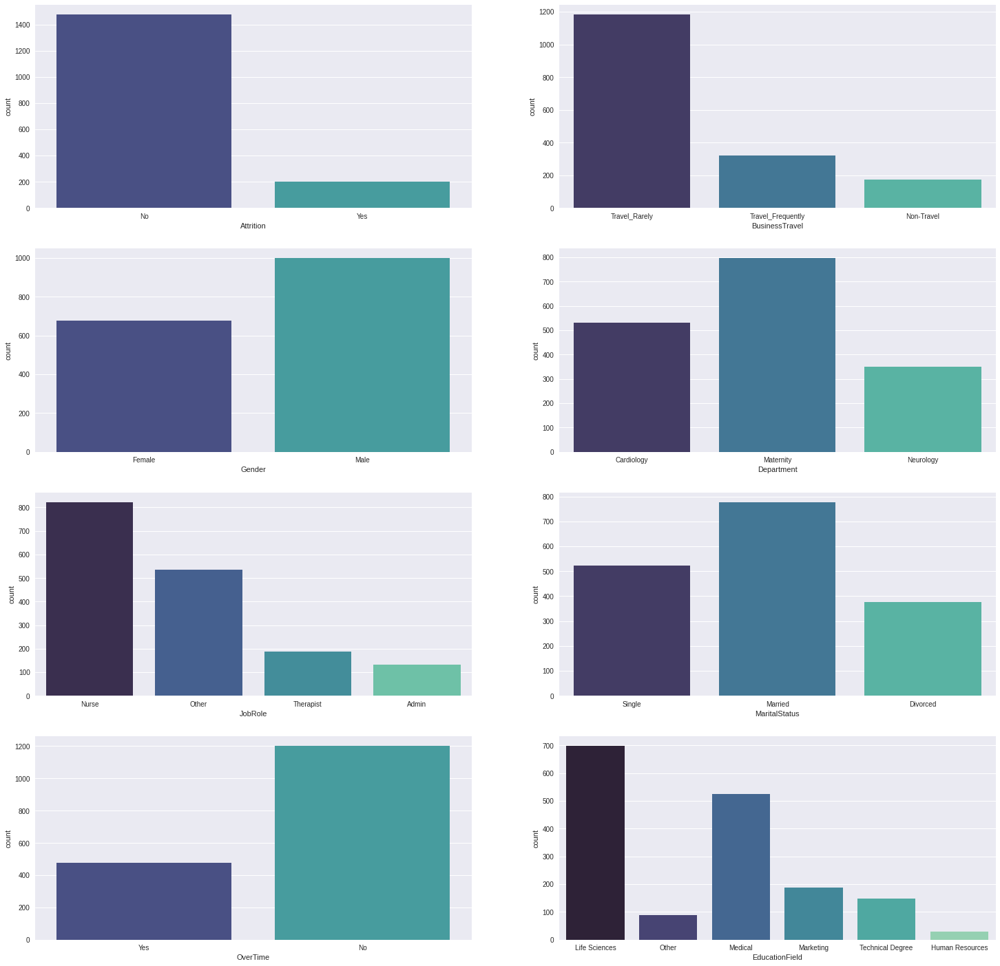

In [ ]:
# Bar Chart Visualization summary

fig, axes = plt.subplots(4, 2, figsize=(25, 25)) 

sns.countplot(ax=axes[0,0],x='Attrition',data=df,palette="mako")
sns.countplot(ax=axes[0,1],x='BusinessTravel', data=df,palette="mako")
sns.countplot(ax=axes[1,0],x='Gender', data=df,palette="mako")
sns.countplot(ax=axes[1,1],x='Department', data=df,palette="mako")
sns.countplot(ax=axes[2,0],x='JobRole', data=df,palette="mako") 
sns.countplot(ax=axes[2,1],x='MaritalStatus', data=df,palette="mako") 
sns.countplot(ax=axes[3,0],x='OverTime', data=df,palette="mako")
sns.countplot(ax=axes[3,1],x='EducationField', data=df,palette="mako")


**Observations worth noting:**

- Attrition is not high only roughly 200 left the healthcare centre
- The population doesnt business travel often, this might be a reason of a small attrition level
- The population gender is mainly represented by male
- Interesting as well to see that there is low overtime, might be related to the low attrition 
- The main population is Married or Single, there are Divorced people but less than married and single
- The main employes are Nurses and the department with most employees is the Maternity Department




## Find Relationships within data

After reviewing population and numerical features distribution we can now try to get more indepth insights investigating categorical to categorical relationships and categorical to numerical to understand which patterns drove the Attrition (although low).


## Relationship between categorical features

## Contingency Tables with Pandas Crosstab

Contingency tables are used in statistics to summarize the relationship between several categorical variables. A contingency table is a special type of frequency distribution table, where two variables are shown simultaneously.

 

The contingency table we are going to create aim to understand if there is a pattern to Attrition Level. The tables we will create are:

- Gender / Attrition
- Overtime / Attrition
- Job role / Attrition
- Business Travel / Attrition
- Department / Attrition
- Marital Status / Attrition
- Education Field / Attrition


## Pandas Crosstab

We will create the contingency tables with Pandas Crosstab. The function is similar to the excel pivot table.

**Figure 1: Gender / Attrition**

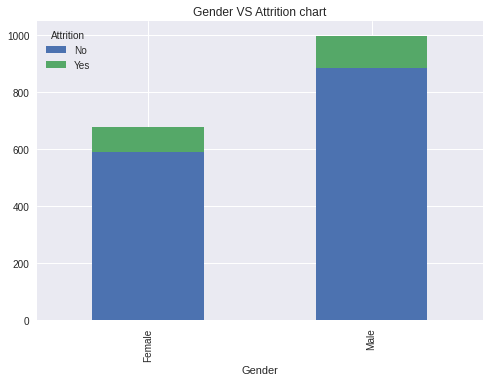

<Figure size 1080x720 with 0 Axes>

In [ ]:
gen_attr = pd.crosstab(index=df_cat['Gender'], columns=df_cat['Attrition'])
gen_attr.plot(kind='bar', stacked=True)
plt.title('Gender VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

Within the workforce, Males left the company more than the females (113 vs 86)

**Figure 2: OverTime / Attrition**

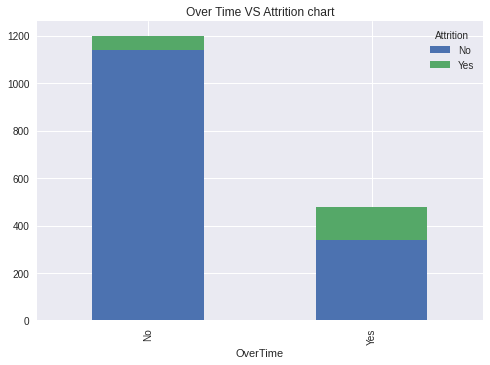

<Figure size 1080x720 with 0 Axes>

In [ ]:
ovrt_attr = pd.crosstab(index=df_cat['OverTime'], columns=df_cat['Attrition'])
ovrt_attr.plot(kind='bar', stacked=True)
plt.title('Over Time VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observation**

With no surprise, the portion of employees that did overtime and left the job is higher than the proportion of the ones that did not had overtime and left the job (139 vs 60). 

However, within the employees that did overtime:

- 139 left the job
- 337 stayed at the job despite the overtime

**Figure 3. Job role / Attrition**

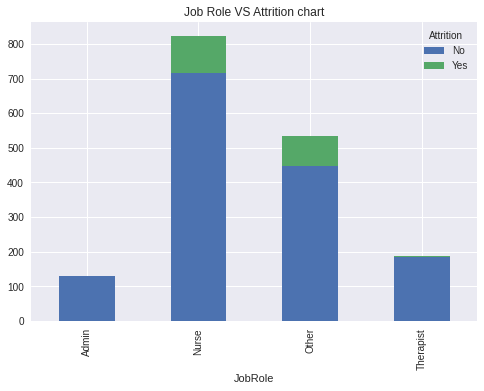

<Figure size 1080x720 with 0 Axes>

In [ ]:
jobr_attr = pd.crosstab(index=df_cat['JobRole'], columns=df_cat['Attrition'])
jobr_attr.plot(kind='bar', stacked=True)
plt.title('Job Role VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

- Nurses is the job role with highest attrition followed by Others
- Probably Male Nurses doing overtime are the segment unhappy.

**Figure 4. Business Travel / Attrition**

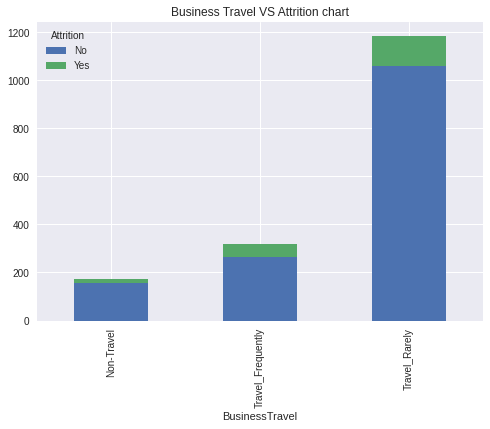

<Figure size 1080x720 with 0 Axes>

In [ ]:
bsntr_attr = pd.crosstab(index=df_cat['BusinessTravel'], columns=df_cat['Attrition'])
bsntr_attr.plot(kind='bar', stacked=True)
plt.title('Business Travel VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

- Apparently the employees that are travelling rarely are the unhappy one and as result they leave their job
- Interesting insight considering sometimes business travels are not well received by employees.

**Figure 5. Department / Attrition**

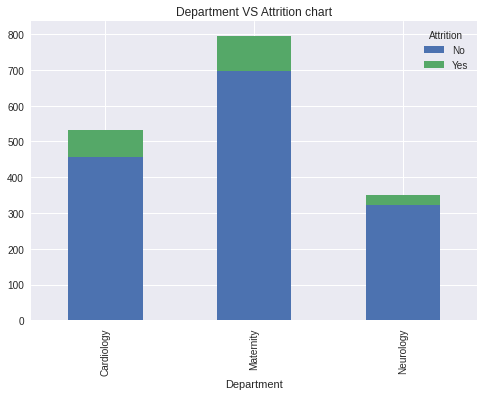

<Figure size 1080x720 with 0 Axes>

In [ ]:
dept_attr = pd.crosstab(index=df_cat['Department'], columns=df_cat['Attrition'])
dept_attr.plot(kind='bar', stacked=True)
plt.title('Department VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

- Cardiology and Maternity are the department with highest attrition compared to Neurology (74 and 98).

**Table 6. Marital Status / Attrition**

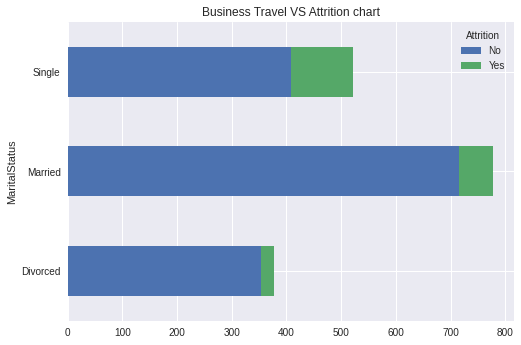

<Figure size 1080x720 with 0 Axes>

In [ ]:
mrtst_attr = pd.crosstab(index=df_cat['MaritalStatus'], columns=df_cat['Attrition'])
mrtst_attr.plot(kind='barh', stacked=True)
plt.title('Business Travel VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

- Single status has the highest number of attrition (114) compared to Married and Divorced
- Just a small portion of divorced left the job.

**Figure 7: Educationfield / Attrition**

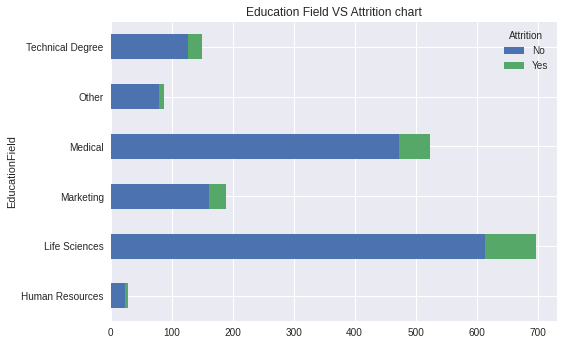

<Figure size 1080x720 with 0 Axes>

In [ ]:
edfld_attr = pd.crosstab(index=df_cat['EducationField'], columns=df_cat['Attrition'])
edfld_attr.plot(kind='barh', stacked=True)
plt.title('Education Field VS Attrition chart')
plt.figure(figsize=(15,10))
plt.show()

**Observations:**

- From an educational background perspective, the employees with LifeSciences studies are the ones quitting their job

## Understanding the statistic significance or strength of relationship within the categorical features

**ChiSquare Test**

The ChiSquare test is used in statistic to evaluate the strength of the relationship between categorical features.

To implement the chisquare test, we are going to use the **Scipy library** and the chi2contingency object. [Source](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.chi2_contingency.html). 

The value we are going to observe to confirm or reject the statistical significance is the p-value. 

If the p-value is less than 0.05, the relationship is statistically significant that means there is a strong relationship between categories.

**Import the Scipy Library and create a function to calculate the p-value and save the results of each category in a dataframe**

In [ ]:
# Library import

from scipy.stats import chi2_contingency

In [ ]:
def chi2_dataframe():
  '''Function to create a dataframe with the relationship statistic significance results         measured by the 
  p-value of the categorical features crosstab applied previosly.
  Main steps of the function:
    1) calculate the chisquare
    2) get the p-value
    3  Create a dictionary with the relationship and the p-value
    3) Output: create the dataframe using 2 columns:
        - Categories relationship
        - p-value
  '''
  # Calculate the chisquare
  chisquare_genattr = chi2_contingency(gen_attr)
  p_val_genattr = chisquare_genattr[1]
  chisquare_ovrtattr = chi2_contingency(ovrt_attr)
  p_val_ovrtattr = chisquare_ovrtattr[1]
  chisquare_jobrattr = chi2_contingency(jobr_attr)
  p_val_jobrattr = chisquare_jobrattr[1]
  chisquare_bsntrattr = chi2_contingency(bsntr_attr)
  p_val_bsntr = chisquare_bsntrattr[1]
  chisquare_dept_attr = chi2_contingency(dept_attr)
  p_val_dept_attr = chisquare_dept_attr[1]
  chisquare_mrtst_attr = chi2_contingency(mrtst_attr)
  p_val_mrtst_attr =  chisquare_mrtst_attr[1]
  # Create a dictionary with p-values for each relationship
  chi2 = {
    'Categories_relationship' : ['Gen_Attr', 'Overtime_Attr', 'Jobrole_Attr', 'BusinTrav_Attr',   'Dept_Attr', 'MaritSt_Attr'],
    'P_value' : [p_val_genattr, p_val_ovrtattr, p_val_jobrattr, p_val_bsntr, p_val_dept_attr,       p_val_mrtst_attr]
      }
  # creating a Dataframe object 
  df_chi2 = pd.DataFrame(chi2)
  return df_chi2

df_cat_pval = chi2_dataframe()

# change the format of the exponential number in decimal
pd.options.display.float_format = '{:,.2f}'.format
# show the p-value dataframe
df_cat_pval


**Observations:**

Looking at the statistical significance bart chat above we can conclude that:

Although we notice that Male category is the one with higher attrition, the relationship has not a statistic significance, hence the healthcare HR department shouldn't focus to solutions dedicated mainly to the male workforce.

The categories where the HR should focus are:

department (Maternity) BusinTravel (employees that not travel often) Jobrole (Nurse) MaritStatus (Mainly single) Overtime (Group of workers with highest overtime)

## Numerical Features vs Attrition

Now we are going to find out if there are patterns between some of the numerical features and the Attrition.

We are going to select only a few. The ones selected are based on the assumptions that describe the actual employee engagement with the healthcare company.

The features are:


- JobInvolvement
- JobSatisfaction
- EnvironmentSatisfaction
- RelationshipSatisfaction
- WorkLifeBalance
- PerformanceRating
- TrainingTimesLastYear
- JobLevel
- YearsSinceLastPromotion
- YearsWithCurrManager
- PercentSalaryHike

**How we check the patterns?**

We are going to create a series of stripplot using seaborn.

**Striplot creation with Seaborn**

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Attrition'>

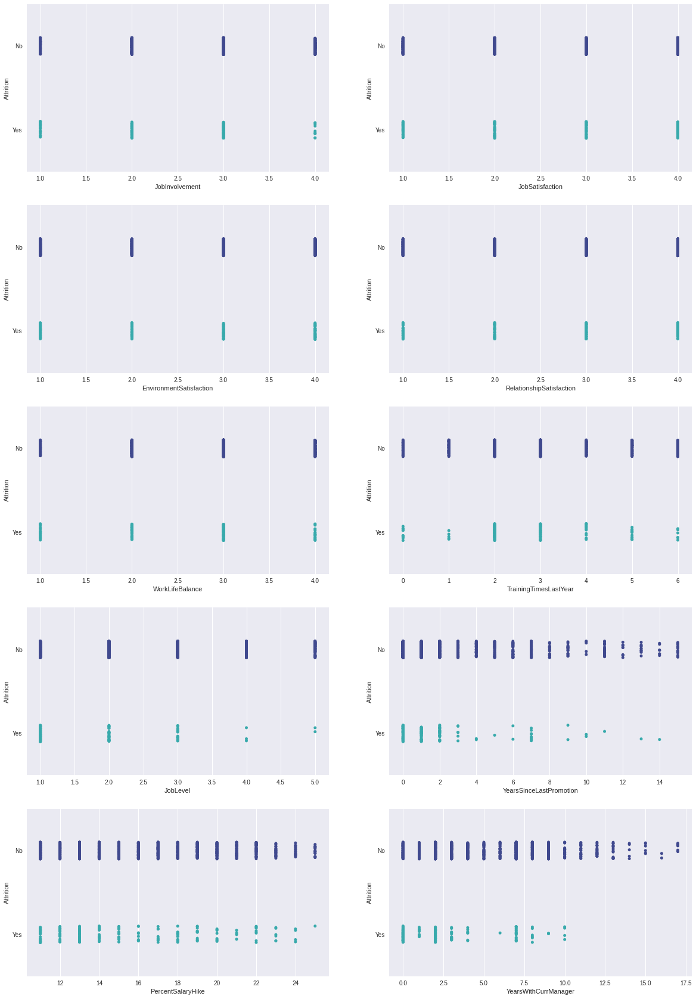

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(20, 30)) 

sns.stripplot(ax=axes[0,0],x='JobInvolvement', y="Attrition", data=df, palette="mako")
sns.stripplot(ax=axes[0,1],x='JobSatisfaction', y="Attrition", data=df,palette="mako")
sns.stripplot(ax=axes[1,0],x='EnvironmentSatisfaction', y="Attrition", data=df,palette="mako")
sns.stripplot(ax=axes[1,1],x='RelationshipSatisfaction', y="Attrition",data=df,palette="mako")
sns.stripplot(ax=axes[2,0],x='WorkLifeBalance', y="Attrition", data=df,palette="mako") 
sns.stripplot(ax=axes[2,1],x='TrainingTimesLastYear', y="Attrition", data=df,palette="mako") 
sns.stripplot(ax=axes[3,0],x='JobLevel', y="Attrition", data=df,palette="mako")
sns.stripplot(ax=axes[3,1],x='YearsSinceLastPromotion', y="Attrition", data=df,palette="mako")
sns.stripplot(ax=axes[4,0],x='PercentSalaryHike', y="Attrition", data=df,palette="mako")
sns.stripplot(ax=axes[4,1],x='YearsWithCurrManager', y="Attrition", data=df,palette="mako")


**Observations**

We can see that there is little difference in means of 'Environment, Worklifebalance, Relationship and Job Satisfaction' across all departments and roles.

However majority of attrition is showing within employees that are around 6 years in current role, within around 3 years since last promotion, around Joblevel 3.

Interesting to observe that Salary Hikes may not be a useful way to prevent attrition in employees.

## Conclusions and key takeaways

**What HR department should do to minimize effectively the job quitting?**

- Monitor the Overtime percentage of employees in specific departments and role (Maternity, Nurse)
- Incentivize business travels where appropriate
- Explore further why single are quitting the job. 
- Implement a policy of job rotations after the employee spends around 2 to 7 years in the same role where possible.